# Statistical Analysis

----

### Import Essential Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import scipy.stats as stats
import jdatetime

### Load the data

In [5]:
data = pd.read_csv("../Divar Dataset/Divar.csv")

/var/folders/9y/lpsdwq1d0bz2t5178sr1rgmr0000gn/T/ipykernel_9184/1735787727.py:1: DtypeWarning: Columns (11,27,29,53) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("../Divar Dataset/Divar.csv")


In [6]:
# Remove the index column
data = data.drop(columns=["Unnamed: 0"])
data.head(5)

,cat2_slug,cat3_slug,city_slug,neighborhood_slug,created_at_month,user_type,description,title,rent_mode,rent_value,...,property_type,regular_person_capacity,extra_person_capacity,cost_per_extra_person,rent_price_on_regular_days,rent_price_on_special_days,rent_price_at_weekends,location_latitude,location_longitude,location_radius
0,temporary-rent,villa,karaj,mehrshahr,2024-08-01 00:00:00,مشاور املاک,۵۰۰متر\n۲۰۰متر بنا دوبلکس\n۳خواب\nاستخر آبگرم ...,باغ ویلا اجاره روزانه استخر داخل لشکرآباد سهیلیه,NaN,NaN,...,NaN,4.0,6,350000.0,1500000.0,3.500000e+09,3500000.0,35.811684,50.936600,500.0
1,residential-sell,apartment-sell,tehran,gholhak,2024-05-01 00:00:00,مشاور املاک,دسترسی عالی به مترو و شریعتی \nمشاعات تمیز \nب...,۶۰ متر قلهک فول امکانات,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,500.0
2,residential-rent,apartment-rent,tehran,tohid,2024-10-01 00:00:00,NaN,تخلیه پایان ماه,آپارتمان ۳ خوابه ۱۳۲ متر,مقطوع,26000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,35.703865,51.373459,NaN
3,commercial-rent,office-rent,tehran,elahiyeh,2024-06-01 00:00:00,NaN,فرشته تاپ لوکیشن\n۹۰ متر موقعیت اداری\nیک اتاق...,فرشته ۹۰ متر دفتر کار مدرن موقعیت اداری,مقطوع,95000000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,residential-sell,apartment-sell,mashhad,emamreza,2024-05-01 00:00:00,مشاور املاک,هلدینگ ساختمانی اکبری\n\nهمراه شما هستیم برای ...,۱۱۵ متری/شمالی رو به آفتاب/اکبری,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Descriptive Statistics

##### Q1. Distribution of Ads in Different Categories for **level 2** & **level 3** **Categorization**. 

In [7]:
# Each cat2_slug number of advertisements
cat2_dist = data.groupby("cat2_slug").size().reset_index(name='Count').sort_values(by='Count', ascending=False)

# Plot the bar chart
fig = px.bar(
    cat2_dist,
    x="cat2_slug",
    y="Count",
    title="Number of Advertisements for Level 2 Categorization"
)

# Setttings
fig.update_traces(
    marker_color="#E3B315"
)
fig.update_layout(
    width=1400,
    height=650,
    plot_bgcolor="#EAF4F4",
    paper_bgcolor="#EAF4F4",
    xaxis_title=None,
    yaxis_title="Number of Advertisements",
    font=dict(color="#18252a"),
    xaxis=dict(
        tickangle=45,
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True
    )
)
fig.show()

In [8]:
# Each cat3_slug number of advertisements
cat3_dist = data.groupby("cat3_slug").size().reset_index(name='Count').sort_values(by='Count', ascending=False)

# Plot the bar chart
fig = px.bar(
    cat3_dist,
    x="cat3_slug",
    y="Count",
    title="Number of Advertisements for Level 3 Categorization"
)

# Setttings
fig.update_traces(
    marker_color="#15E36B"
)
fig.update_layout(
    width=1400,
    height=650,
    plot_bgcolor="#EAF4F4",
    paper_bgcolor="#EAF4F4",
    xaxis_title=None,
    yaxis_title="Number of Advertisements",
    font=dict(color="#18252a"),
    xaxis=dict(
        tickangle=45,
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True
    )
)
fig.show()

➡️ **Analysis:** <br>
As we can see, in <b>Cat_slug2</b>: <i>`residential-sell`</i> and <i>`residential-rest`</i> type are amongt the top frequented of all Cat_slug2 ads.<br>Similarly, we can see in <b>Cat_slug3</b>, <i>`apartment_sell/rent`</i> are the most advertised buildings. We might conclude that, apartments are the most popular residential housing type.

In [9]:
del cat2_dist, cat3_dist

---

##### Q2. Histogram Chart of **Construction Year** Feature. 

Preprocess the feature

In [23]:
# Digits conversion to english
def persian_to_english_digits(text):
    if pd.isna(text):
        return text

    persian_digits = "۰۱۲۳۴۵۶۷۸۹"
    english_digits = "0123456789"

    translation_table = str.maketrans(persian_digits, english_digits)
    return str(text).translate(translation_table)

data_tmp = data.copy()

data_tmp['construction_year'] = data_tmp.loc[:, 'construction_year'].apply(
    lambda x: persian_to_english_digits(x) if isinstance(x, str) else x)

# change to only digits
data_tmp['construction_year'] = data_tmp['construction_year'].replace('قبل از 1370', '1370')

# change to numeric type
data_tmp['construction_year'] = pd.to_numeric(data_tmp['construction_year'], errors='coerce')
data_tmp['construction_year'].shape

(1000000,)

Plot the histrogram for construction_year:

In [24]:
#  Plot the histrogram for construction_year 
fig = go.Figure()

fig.add_trace(go.Histogram(
    x=data_tmp['construction_year'],
    name="Count",
    marker_color='skyblue',
    marker_line_color='white',
    marker_line_width=1,
    opacity=0.8,
    texttemplate="%{y}",
    textfont_size=14,
    hovertemplate="Construction year: %{x}, Ads count: %{y}<extra></extra>",
    hoverlabel=dict(
    bgcolor="lightcoral",
    bordercolor="black",
    font_size=12,
    font_color="Black"
    )
))

fig.update_layout(
    title={
        'text': "Construction year Histogram",
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': {'size': 20, 'color': 'darkblue'}
    },
    xaxis_title="Construction year",
    yaxis_title="Ads count",
    bargap=0.05,
    bargroupgap=0.1,
    plot_bgcolor='whitesmoke',
    paper_bgcolor='white',
    font=dict(family="Arial, sans-serif", size=12, color="black"),
    width=1300,
    height=600
)

fig.update_xaxes(
    tickmode='linear',
    dtick=1,
    tickangle=-45,
    tickfont=dict(size=12),
)

fig.show()


➡️ As it's obvious, the number of recorded advertisements has **increased** over time and during the years 1370 to 1403. In the meantime, **all advertisements before 1370 have become 1370** and the reason for the high value of this column is this issue. It can be clearly seen that the number of advertisements has increased more than 5 times during the 33-year period. But the interesting point may be the difference in this number in 1403 compared to previous years, which has recorded a sudden increase of about 2 times.

In [25]:
del data_tmp

---

##### Q3. The Number of Ads Published in Different Months for **Sale** and **Rent**.

We want to check the trend for the number of Ads in both type of <i>Sell, Rent</i> on the basis of a time serie for different <i>months</i>

> Note: To choose between Rental and Sell Ads, We know that when <b>price_value</b> is None ==> This is a Rental Ads and viceversa!

In [26]:
data_tmp = data.copy()

In [27]:
# check the all type of prices nulls
sell_rent_null = data_tmp[(data_tmp['price_value'].isna()) & (data_tmp['rent_value'].isna())]
temp = sell_rent_null[(sell_rent_null['rent_price_on_regular_days'].isna()) &
                                (sell_rent_null['rent_price_on_special_days'].isna()) &
                                (sell_rent_null['rent_price_at_weekends'].isna())
                                ]
temp.shape


(62060, 60)

It shows that we have 62060 rows in the data which there are not any columns regrading to their prices! So we have to remove them all in the first step.

In [28]:
# Remove Null prices
mask = (data_tmp['price_value'].isna()) & \
       (data_tmp['rent_value'].isna()) & \
       (data_tmp['rent_price_on_regular_days'].isna()) & \
       (data_tmp['rent_price_on_special_days'].isna()) & \
       (data_tmp['rent_price_at_weekends'].isna())
data_tmp = data_tmp[~mask]

In [29]:
data_tmp['created_at_month'].isna().sum()

np.int64(0)

In [ ]:
# Convert the 'created_at' column to datetime
month_names = {
    1: 'Farvardin', 2: 'Ordibehesht', 3: 'Khordad',
    4: 'Tir', 5: 'Mordad', 6: 'Shahrivar',
    7: 'Mehr', 8: 'Aban', 9: 'Azar',
    10: 'Dey', 11: 'Bahman', 12: 'Esfand'
}

data_tmp['shamsi_month_name'] = data_tmp['created_at_month'].apply(
    lambda x: month_names.get(jdatetime.datetime.fromgregorian(
        date=pd.to_datetime(x, errors='coerce').date()).month, 'Unknown') if pd.notna(x) and 
        pd.to_datetime(x, errors='coerce') is not pd.NaT 
        else x)
data_tmp['shamsi_month_name'].value_counts()

In [ ]:
# Creat mask for 3 differet scenario: 
# 1. sell only ads
# 2. monthly rent only ads
# 3. rent ads but not on regular monthly basis

mask_sell = (data_tmp['rent_value'].isna()) & \
            (data_tmp['rent_price_on_regular_days'].isna()) & \
            (data_tmp['rent_price_on_special_days'].isna()) & \
            (data_tmp['rent_price_at_weekends'].isna())

mask_monthly_rent = (data_tmp['price_value'].isna()) & \
                    (data_tmp['rent_price_on_regular_days'].isna()) & \
                    (data_tmp['rent_price_on_special_days'].isna()) & \
                    (data_tmp['rent_price_at_weekends'].isna())

month_to_num = {month_name: month_num for month_num, month_name in month_names.items()}

sell_counts = data_tmp[mask_sell]['shamsi_month_name'].value_counts().reset_index()
sell_counts.columns = ['month', 'Sell only Ads']
sell_counts['month_number'] = sell_counts['month'].map(month_to_num)
sell_counts = sell_counts.sort_values('month_number').drop('month_number', axis=1)

rent_counts = data_tmp[mask_monthly_rent]['shamsi_month_name'].value_counts().reset_index()
rent_counts.columns = ['month', 'Rent only Ads']
rent_counts['month_number'] = rent_counts['month'].map(month_to_num)
rent_counts = rent_counts.sort_values('month_number').drop('month_number', axis=1)

fig = make_subplots(rows=1, cols=2, subplot_titles=('Sell Ads Count', 'Rent Ads Count'))
fig.add_trace(go.Bar(x=sell_counts['month'], y=sell_counts['Sell only Ads'], name='Sell'), row=1, col=1)
fig.add_trace(go.Bar(x=rent_counts['month'], y=rent_counts['Rent only Ads'], name='Rent'), row=1, col=2)

fig.update_layout(title=dict(
        text='Sell and Rent distribution in Ads throughout the months',
        x=0.5,
        xanchor='center',
        yanchor='top'),
        xaxis2=dict(tickangle=-45),
        xaxis1=dict(tickangle=-45), showlegend=False)
fig.show()


# Scatter+line plot both in one plot to compare better
fig_line = go.Figure()
fig_line.add_trace(go.Scatter(
    x=sell_counts['month'],
    y=sell_counts['Sell only Ads'],
    mode='lines+markers',
    name='Sell only Ads',
    line=dict(color='blue', width=2),
    marker=dict(size=8, color='blue'),
    hovertemplate='<b>%{fullData.name}</b><br>Month: %{x}<br>Count: %{y}<extra></extra>'
))

fig_line.add_trace(go.Scatter(
    x=rent_counts['month'],
    y=rent_counts['Rent only Ads'],
    mode='lines+markers',
    name='Rent only Ads',
    line=dict(color='red', width=2),
    marker=dict(size=8, color='red'),
    hovertemplate='<b>%{fullData.name}</b><br>Month: %{x}<br>Count: %{y}<extra></extra>'
))

fig_line.update_layout(
    title=dict(
        text='Comparison of Sell and Rent Ads Distribution Across Months',
        x=0.5,
        xanchor='center',
        yanchor='top'
    ),
    xaxis=dict(
        title='Month',
        tickangle=-45
    ),
    yaxis=dict(
        title='Ads Count'
    ),
    hovermode='x unified'
)

fig_line.show()

**Chart Analysis:**<br>
As is clear from the histogram and line graph above, in the winter season, the number of advertisements related to both categories has decreased significantly. This indicates that the property sales and rental market has been stagnant in the winter season.

However, from the end of spring (Khordad) to the end of summer (Shahrivar), the sales and rental market has been more prosperous. While the rental market trend has been downward in the 3 months of autumn, the property sales market has experienced an upward trend, such that in December, the highest number of advertisements for property sales has been reached.

In [ ]:
# 3. daily rent ads only
mask_daily_rent =    ((data_tmp['price_value'].isna()) & (data_tmp['rent_value'].isna())) & \
                        (data_tmp['rent_price_on_regular_days'].notna()) | \
                        (data_tmp['rent_price_on_special_days'].notna()) | \
                        (data_tmp['rent_price_at_weekends'].notna())

daily_rent_counts = data_tmp[mask_daily_rent]['shamsi_month_name'].value_counts().reset_index()
daily_rent_counts.columns = ['month', 'Daily rent Ads (Villa)']
daily_rent_counts['month_number'] = daily_rent_counts['month'].map(month_to_num)
daily_rent_counts = daily_rent_counts.sort_values('month_number').drop('month_number', axis=1)


fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=daily_rent_counts['month'], 
        y=daily_rent_counts['Daily rent Ads (Villa)'], 
        mode='lines+markers',
        name='Daily Rennt',
    )
)

fig.update_layout(
    title=dict(
        text='Daily Rent ads (Villa) distribution throughout the months',
        x=0.5,
        xanchor='center',
        yanchor='top',
        font=dict(size=18, family='Arial', color='black')
    ),
    xaxis=dict(
        title='Shamsi month name',
        tickangle=-45,
        title_font=dict(size=14, color='black'),
        tickfont=dict(size=12, color='black')
    ),
    yaxis=dict(
        title='Ads Count',
        title_font=dict(size=14, color='black'),
        tickfont=dict(size=12, color='black')
    )
)

fig.show()

**Chart Analysis:** <br>
The general trend is similar to the previous charts, but with a slight difference. Here, in the summer season, the number of ads related to daily rentals has been higher than in other seasons of the year, which indicates that since this type of property is related to travelers and short-term stays (weekly or daily), it can be concluded that in this season of the year, the number of trips has also been higher, especially in Shahrivar, which is before the start of the school year and most people go on summer trips. For this reason, in Shahrivar, the number of ads related to this category has reached its maximum.

In [ ]:
del data_tmp, sell_counts, rent_counts, mask_daily_rent, daily_rent_counts, mask_daily_rent, mask_monthly_rent, mask_sell, sell_rent_null, temp, mask

---

##### Q4. The Distribution of Sales Price (`price_value`) for Level 3 Categories in a Graph.

In [8]:
# Mean price for each cat3_slug
price_dist_cat3 = (
    data.groupby("cat3_slug")["price_value"]
    .mean()
    .reset_index()
    .sort_values(by="price_value", ascending=False)
)

fig = px.bar(
    price_dist_cat3,
    x="cat3_slug",
    y="price_value",
    title="Mean Price of Advertisements for Level 3 Categorization"
)

fig.update_traces(marker_color="#E3B315")

fig.update_layout(
    width=1400,
    height=650,
    plot_bgcolor="#EAF4F4",
    paper_bgcolor="#EAF4F4",
    xaxis_title=None,
    yaxis_title="Mean Price",
    font=dict(color="#18252a"),
    xaxis=dict(
        categoryorder="array",
        categoryarray=price_dist_cat3["cat3_slug"],
        tickangle=45,
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True
    )
)

fig.show()


➡️ Shop, Office, and plot sell are the first, second, and third ranks in mean price between 20 and 30 billions.<br>
➡️ The lowest mean price belongs workspaces, suites, villas (including house_villas), apartment-rent, office-rent, shop-rent and industry/agriculture/business rent.

In [ ]:
del price_dist_cat3

---

##### Q5. The ads in each region on a geographic heatmap. Which region has the highest density of ads?
**Answer:** *Tehran*

In [12]:
import geopandas as gpd

iran = gpd.read_file(
    "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
)

iran = iran[iran["NAME"] == "Iran"].to_crs("EPSG:4326")
iran_geom = iran.geometry.iloc[0]

In [13]:
df_geo = data[
    data["location_latitude"].notna() &
    data["location_longitude"].notna()
].copy()

gdf_points = gpd.GeoDataFrame(
    df_geo,
    geometry=gpd.points_from_xy(
        df_geo["location_longitude"],
        df_geo["location_latitude"]
    ),
    crs="EPSG:4326"
)

gdf_points = gdf_points[gdf_points.within(iran_geom)]

In [ ]:
import folium
from folium.plugins import HeatMap

center_lat = gdf_points["location_latitude"].mean()
center_lon = gdf_points["location_longitude"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=5,
    tiles="cartodbpositron"
)

heat_data = gdf_points[
    ["location_latitude", "location_longitude"]
].values.tolist()

HeatMap(
    heat_data,
    radius=12,
    blur=15,
    min_opacity=0.4
).add_to(m)

m


-> According to the heatmap, **Tehran** is the area with most advertisement.<br>
-> In Addition, we also have ads from other countries such as: *Irag*, *Saudi Arabia*, *UAE*, *Qatar*, *Azarbaijan*, *Afghanistan*, *Turkmenistan*, etc.

In [ ]:
del df_geo, center_lat, center_lon, heat_data, map

---

##### Q6. The average rental price trend by months of ads.

In [ ]:
import jdatetime

# Convert to datetime
data["created_at_month"] = pd.to_datetime(data["created_at_month"])

# Convert to Jalali month name
data["jalali_month"] = data["created_at_month"].apply(
    lambda x: jdatetime.date.fromgregorian(
        date=x.date()
    ).strftime("%B")
)
data.jalali_month.value_counts()

jalali_month
Tir            133319
Mordad         132522
Mehr           126606
Khordad        125695
Aban           121819
Shahrivar      121615
Azar           116998
Ordibehesht    108820
Farvardin        7215
Dey              2099
Esfand           1912
Bahman           1380
Name: count, dtype: int64

In [ ]:
month_index = {
    'Farvardin': 1, 'Ordibehesht': 2, 'Khordad': 3, 'Tir': 4, 'Mordad': 5, 'Shahrivar': 6,
    'Mehr': 7, 'Aban': 8, 'Azar': 9, 'Dey': 10, 'Bahman': 11, 'Esfand': 12
}

In [ ]:
# Group by month and find mean rent values for them
monthly_mean_rent = data.groupby(["jalali_month"])['transformable_rent'].mean().reset_index()

monthly_mean_rent['month_index'] = monthly_mean_rent['jalali_month'].map(month_index)
monthly_mean_rent = monthly_mean_rent.sort_values('month_index')
monthly_mean_rent

,jalali_month,transformable_rent,month_index
5,Farvardin,2.964253e+07,1
9,Ordibehesht,1.794862e+10,2
6,Khordad,2.133482e+10,3
11,Tir,2.077122e+10,4
8,Mordad,4.198013e+10,5
10,Shahrivar,5.012272e+10,6
7,Mehr,7.633000e+10,7
0,Aban,4.586934e+10,8
1,Azar,5.343412e+10,9
3,Dey,3.014109e+07,10


In [ ]:
# Plot the line chart
fig = px.line(
    monthly_mean_rent,
    x="jalali_month",
    y="transformable_rent",
    title="Mean Rent Trend Through Months"
)

# Setttings
fig.update_traces(
    marker_color="#E3B315"
)
fig.update_layout(
    width=1400,
    height=650,
    plot_bgcolor="#EAF4F4",
    paper_bgcolor="#EAF4F4",
    xaxis_title=None,
    yaxis_title="Mean Rent",
    font=dict(color="#18252a"),
    xaxis=dict(
        tickangle=45,
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        showgrid=True,
        zeroline=True
    )
)
fig.show()

In [ ]:
del monthly_mean_rent

---

##### Q7. Calculate the **Real Price** for the average price (price_value) in the years 1400 to 1403 and compare the real price trend with **Nominal Price**.


First, find the nominal price per year:

In [ ]:
# Group by year and find nominal sell values for them
sell_data = data[data['price_value'].notna()].copy() # Remove NaNs
sell_data['created_at_month'] = pd.to_datetime(sell_data['created_at_month']) # Convert to datetime

sell_data['jalali_year'] = sell_data['created_at_month'].apply(lambda x: jdatetime.date.fromgregorian(date = x.date()).year) # Extract jalaly year

sell_data = sell_data[sell_data['jalali_year'].between(1400, 1403)] # Select years between 1400 and 1403

In [ ]:
# Find mean nominal price for each year
nominal_price_mean = sell_data.groupby('jalali_year')['price_value'].mean().reset_index() 
nominal_price_mean['jalali_year'] = nominal_price_mean['jalali_year'].astype('Int16')
nominal_price_mean

,jalali_year,price_value
0,1400,1.066667e+09
1,1401,1.882049e+10
2,1402,7.918916e+09
3,1403,1.743388e+10


Now, we calculate real mean price.
For this purpose, we devide prices by a **price index** called **'CPI'**.

We set 1400 as our **Base Year**, So we have:<br>
- **CPI(1400) = 100**

In [ ]:
# CPI values for each year
cpi_yearly = pd.DataFrame({
    "jalali_year": [1400, 1401, 1402, 1403],
    "cpi": [100.0,  # base year
            145.75,
            230.2,
            328.5]
})

In [ ]:
# Merge nominal price with cpi
price_with_cpi = nominal_price_mean.merge(cpi_yearly, on="jalali_year", how="left")

# Calculate mean real price
price_with_cpi["mean_real_price_1400"] = (
    price_with_cpi["price_value"] / (price_with_cpi["cpi"] / 100)
)

# Rename 
price_with_cpi = price_with_cpi.rename(
    columns={"price_value": "mean_nominal_price"}
)

In [ ]:
fig = go.Figure()

# Nominal price
fig.add_trace(
    go.Scatter(
        x=price_with_cpi["jalali_year"],
        y=price_with_cpi["mean_nominal_price"] / 1_000_000,
        mode="lines+markers",
        name="Nominal price"
    )
)

# Real price (base 1400)
fig.add_trace(
    go.Scatter(
        x=price_with_cpi["jalali_year"],
        y=price_with_cpi["mean_real_price_1400"] / 1_000_000,
        mode="lines+markers",
        name="Real price (base 1400)"
    )
)

fig.update_layout(
    title="Nominal vs Real Mean Property Price (1400–1403)",
    xaxis_title="Jalali Year",
    yaxis_title="Mean Price (million)",
    xaxis=dict(
        tickmode="linear"
    ),
    template="plotly_white",
    width=1300,
    height=650
)
fig.show()

➡️ It is obvious that both real price and nominal have almost a similar trend. They both rise and fall at the same points (years), but real price has lower values due to inflations.

In [ ]:
del sell_data, nominal_price_mean, cpi_yearly, price_with_cpi

---

##### Q8. Correlation matrix for price amount, land area, infrastructure, capacity, number of rooms, and latitude and longitude.

In [ ]:
# Columns to 
cols = [
    "price_value",
    "land_size",
    "building_size",
    "regular_person_capacity",
    "rooms_count",
    "location_longitude",
    "location_latitude"
]

# Delete null rows
data_corr = data[cols]

Preprocess the data:

In [ ]:
# Convert rooms_count to numeric
rooms_map = {
    "بدون اتاق": 0,
    "یک": 1,
    "دو": 2,
    "سه": 3,
    "چهار": 4,
    "پنج یا بیشتر": 5 #* We choose 5 as a representor of number of 5 or more
}

data_corr["rooms_count"] = data_corr["rooms_count"].map(rooms_map)

/var/folders/9y/lpsdwq1d0bz2t5178sr1rgmr0000gn/T/ipykernel_10375/702173275.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Scale the data features:

In [ ]:
# Scale the columns using Robust Scalar
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
data_corr[cols] = scaler.fit_transform(data_corr[cols])

/var/folders/9y/lpsdwq1d0bz2t5178sr1rgmr0000gn/T/ipykernel_10375/3529930287.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Correlation matrix
corr_matrix = data_corr.corr(method='pearson')
corr_matrix

,price_value,land_size,building_size,regular_person_capacity,rooms_count,location_longitude,location_latitude
price_value,1.000000,-0.000417,0.051693,NaN,0.014013,0.001798,0.003166
land_size,-0.000417,1.000000,0.372622,NaN,-0.004870,0.005912,-0.007302
building_size,0.051693,0.372622,1.000000,0.018496,-0.011791,0.001235,-0.010362
regular_person_capacity,NaN,NaN,0.018496,1.000000,0.344266,0.041704,-0.046206
rooms_count,0.014013,-0.004870,-0.011791,0.344266,1.000000,0.042018,-0.021123
location_longitude,0.001798,0.005912,0.001235,0.041704,0.042018,1.000000,-0.222207
location_latitude,0.003166,-0.007302,-0.010362,-0.046206,-0.021123,-0.222207,1.000000


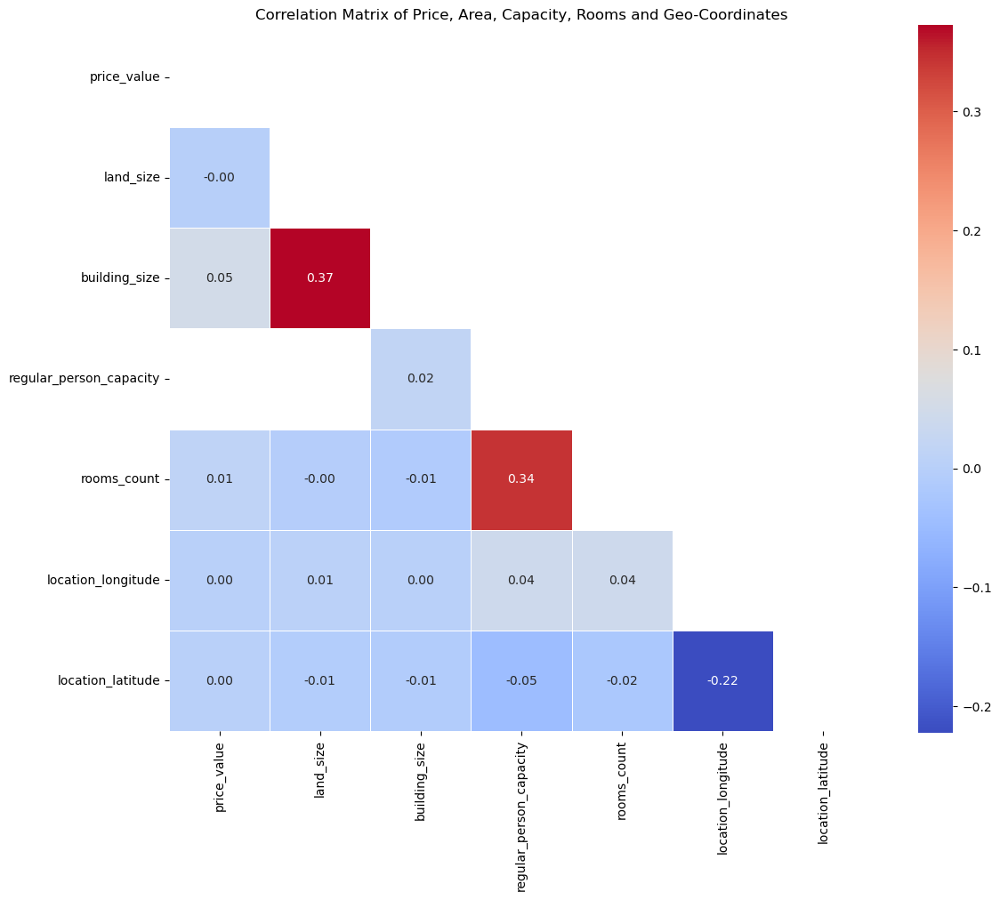

In [ ]:
plt.figure(figsize=(12, 10))

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(
    corr_matrix,
    annot=True,          
    fmt=".2f",     
    cmap="coolwarm",
    mask=mask,
    square=True,
    linewidths=0.5
)

plt.title("Correlation Matrix of Price, Area, Capacity, Rooms and Geo-Coordinates")
plt.tight_layout()
plt.show()

**Important Correlations:**

➡️ **Posetive Medium Correlation:** `building_size`, `land_size` | `rooms_count`, `regular_person_capacity`<br>
➡️ **Negative Weak Correlation:** `location_latitude`, `location_longitude`

**↪** Since **latitude** and **longitude** have negative correlation, it can be concluded that by lowering the value of `x` (longitude) the value of `y` (latitude) increases.<br>
Therefore, the majority of data points must be located in the **North-West** of Iran, and the more we go to South-East, the less data point we see. 

In [ ]:
del data_corr, corr_matrix

---

##### Q9 (Haniye). In which areas are houses with balconies, elevators, security guards, barbecues, and swimming pools mainly located?

In [ ]:
# Seperating wanted features from dataset
features_cols = [
    'has_balcony',
    'has_elevator',
    'has_barbecue',
    'has_pool',
    'has_security_guard'
]

# Make a bollean columns that says wether a property has all features
data['has_features'] = data[features_cols].all(axis=1)

regions_data = data[['location_latitude', 'location_longitude', 'has_features']]
regions_data = regions_data[regions_data['has_features'] == True]
regions_data = regions_data.dropna()

In [17]:
import geopandas as gpd

iran = gpd.read_file(
    "https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_countries.zip"
)

iran = iran[iran["NAME"] == "Iran"].to_crs("EPSG:4326")
iran_geom = iran.geometry.iloc[0]

gdf_points = gpd.GeoDataFrame(
    regions_data,
    geometry=gpd.points_from_xy(
        regions_data["location_longitude"],
        regions_data["location_latitude"]
    ),
    crs="EPSG:4326"
)

# Keep only points inside Iran
gdf_points = gdf_points[gdf_points.within(iran_geom)]

In [ ]:
import folium
from folium.plugins import HeatMap

heat_data = gdf_points[
    ["location_latitude", "location_longitude"]
].values.tolist()

center_lat = gdf_points["location_latitude"].mean()
center_lon = gdf_points["location_longitude"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=5,
    tiles="cartodbpositron"
)

HeatMap(
    heat_data,
    radius=15,
    blur=20,
    min_opacity=0.4
).add_to(m)

m

Text(0.5, 1.0, 'Regions that Have Properties with These Features')

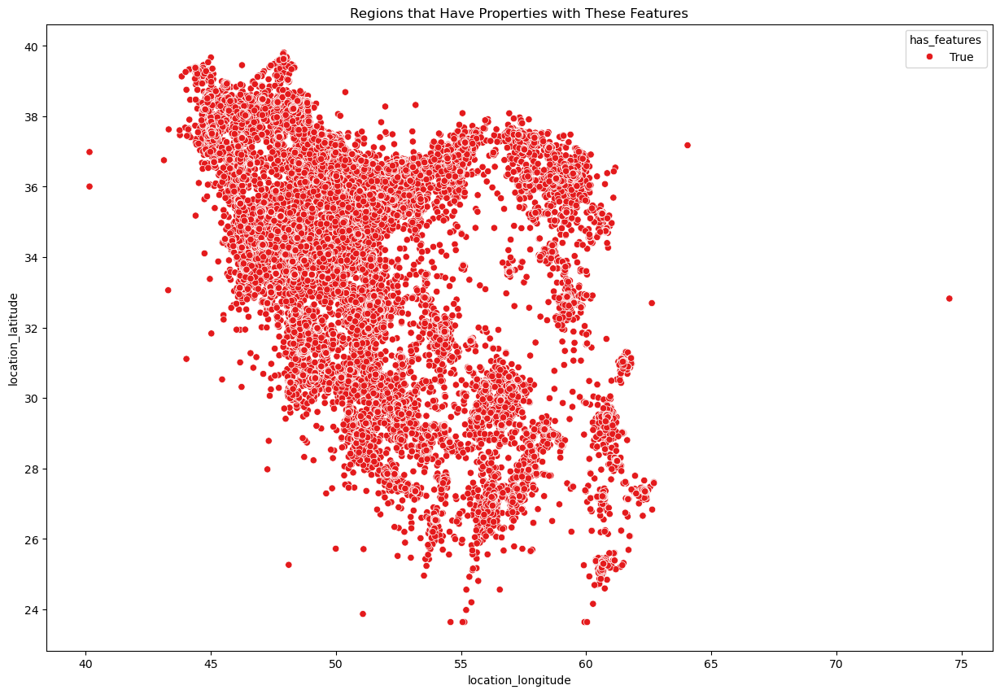

In [ ]:
# Show which properties has these features
plt.figure(figsize=(15, 10))
sns.scatterplot(data=regions_data, x='location_longitude', y='location_latitude', hue='has_features', palette='Set1')
plt.title('Regions that Have Properties with These Features')

In [ ]:
del m, regions_data

---

## Hypothesis Tests

##### Q1. Given the growth in migration from smaller cities to metropolitan areas and the density of population in these areas, it is thought that the average area of ​​residential houses in metropolitan areas is smaller than in small towns and villages. Does the data set support this hypothesis?

> **H₀ (null hypothesis):** Residential properties in metropolises are not smaller on average.

-> This is a **one-tailed** Hypothesis.

**First, preprocess the data:**

In [10]:
# Load city classification data
city_class = pd.read_csv("../Divar Dataset/iran_city_classification.csv")

# Preprocess
city_class = city_class.rename( # Make the cols names Farsi
    columns={
        "نام شهر": "city_slug",
        "دسته‌بندی": "city_category",
    }
)

city_class["city_category"] = city_class["city_category"].map({ # Make the values Farsi
    'شهر کوچک': 'town',
    'کلان‌شهر': 'metropolis'
})

city_class.head(10)

,city_slug,city_category
0,karaj,metropolis
1,tehran,metropolis
2,mashhad,metropolis
3,ahvaz,metropolis
4,kermanshah,metropolis
5,mahdasht-city,town
6,pardis-city,town
7,foolad-shahr,town
8,rasht,town
9,mahabad,town


In [11]:
# Merging the data
data_2 = data.merge(city_class, on="city_slug", how="left")
data_2['city_category'].value_counts()

city_category
town          498478
metropolis    464799
Name: count, dtype: int64

**Check Distributions Normality Using Histograms:**

Text(0.5, 1.0, 'Distribution of Areas in Metropolises')

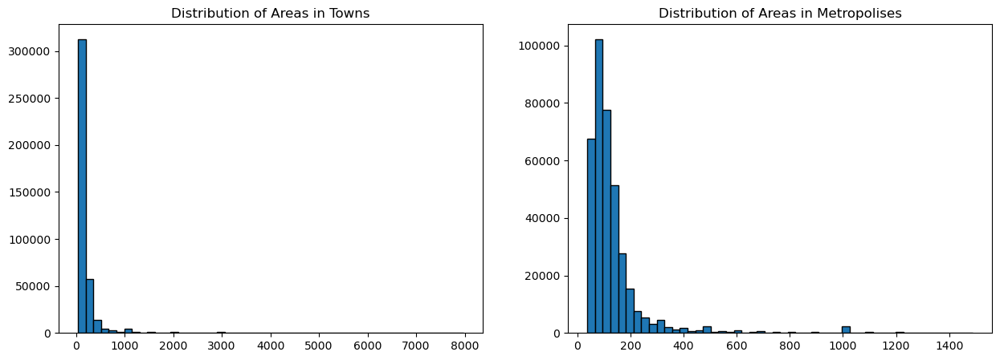

In [12]:
# Distributions
metropolis_props_area = data_2[
    (data_2['city_category'] == 'metropolis') & 
    ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
    ]['building_size']

town_props_area = data_2[
    (data_2['city_category'] == 'town') &
      ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
      ]['building_size']

# Removing NaNs
metropolis_props_area = metropolis_props_area.dropna()
town_props_area = town_props_area.dropna()

# Cut extreme outliers
upper = metropolis_props_area.quantile(0.99)
lower = metropolis_props_area.quantile(0.01)

metropolis_props_area = metropolis_props_area[(metropolis_props_area < upper) & (metropolis_props_area > lower)]

upper = town_props_area.quantile(0.99)
lower = town_props_area.quantile(0.01)

town_props_area = town_props_area[(town_props_area < upper) & (town_props_area > lower)]

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(town_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas in Towns')
plt.subplot(1, 2, 2)
plt.hist(metropolis_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas in Metropolises')

-> According to histograms, both distributions are extremely **right skewed,** so we use a non-parametric method to thest our hypothesis.

> ⚠️ **Note:** Since the distributions have almost 1M samples, we can't use Shapiro Mehtod to check normality.

Now, Test the Hypothesis:

In [13]:
# Sanity check
town_props_area.median(), metropolis_props_area.median(), len(town_props_area), len(metropolis_props_area)

(110.0, 100.0, 407997, 380395)

In [ ]:
# Test our hypothesis using Mann–Whitney U test (A non-parametric test)
stat, p_value = stats.mannwhitneyu(metropolis_props_area, town_props_area, alternative='less')

if p_value < 0.05:
    print("✅ H₀ is Rejected -> The distributions are similar, so the main hypothesis might be true.")
else:
    print("❌ Failed to Reject H₀ -> The distributions are not similar, so the main hypothesis might be false.")

✅ H₀ is Rejected -> Residential Properties in Metropolises Do Have Smaller Average Area Than in Towns


**Second Method: Apply Log Transformation on Distributions And Use T-test**

Text(0.5, 1.0, 'Distribution of Areas in Metropolises')

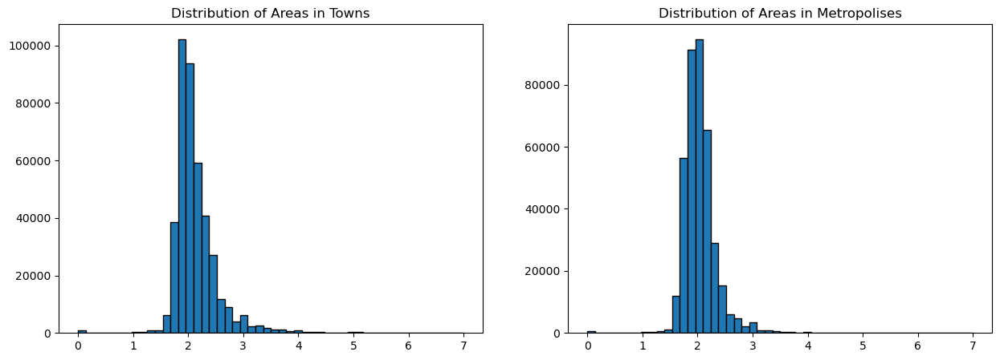

In [29]:
# Distributions
metropolis_props_area = data_2[
    (data_2['city_category'] == 'metropolis') & 
    ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
    ]['building_size']

town_props_area = data_2[
    (data_2['city_category'] == 'town') &
      ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
      ]['building_size']

# Removing NaNs
metropolis_props_area = metropolis_props_area.dropna()
town_props_area = town_props_area.dropna()

# Apply log transformation
metropolis_props_area = np.log10(metropolis_props_area)
town_props_area = np.log10(town_props_area)

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(town_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas in Towns')
plt.subplot(1, 2, 2)
plt.hist(metropolis_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas in Metropolises')

-> Since the distributions are normal, we are able to test our hypothesis using **parameteric methods** (e.x. t-test).

In [30]:
# Test our hypothesis using t-test (A parametric test)
from scipy.stats import ttest_ind

t_stat, p_value = ttest_ind(
    metropolis_props_area,
    town_props_area,
    alternative="less"
)

if p_value < 0.05:
    print("✅ H₀ is Rejected -> Residential Properties in Metropolises Do Have Smaller Average Area Than in Towns")
else:
    print("❌ Failed to Reject H₀ -> No Sufficient evidence to Prove That Houses in Metropolises Are Smaller")

✅ H₀ is Rejected -> Residential Properties in Metropolises Do Have Smaller Average Area Than in Towns


**Conclusion:** Both parametric and non-parametric methods rejected the null-hypothesis, so the alternative hypothesis is **TRUE**.

In [31]:
del metropolis_props_area, town_props_area, upper, lower, city_class

---

##### Q2. Is the average area of ​​older homes larger than newly built homes?

> **H₀ (null hypothesis):** Older residential properties are smaller on average.

-> This is a **one-tailed** Hypothesis.

**Preprocess The data:**

In [32]:
# Functions to preprocess construction_year column
def persian_to_english_digits(text):
    if pd.isna(text):
        return text

    persian_digits = "۰۱۲۳۴۵۶۷۸۹"
    english_digits = "0123456789"

    translation_table = str.maketrans(persian_digits, english_digits)
    return str(text).translate(translation_table)

def clean_construction_year(value):
    if pd.isna(value):
        return None

    value = str(value).strip()

    # Convert Persian Digits to English
    value = persian_to_english_digits(value)

    # Handle special case
    if "قبل از" in value:
        return 1369  # boundary assumption

    # Convert to integer if possible
    try:
        return int(value)
    except ValueError:
        return None

In [33]:
# Preprocess the column
data_2["construction_year_eng"] = data["construction_year"].apply(clean_construction_year)
data_2.construction_year_eng.head()

0       NaN
1    1384.0
2    1401.0
3    1400.0
4    1403.0
Name: construction_year_eng, dtype: float64

**Check Distributions Normality Using Histograms:**

Text(0.5, 1.0, 'Distribution of Area for New Houses')

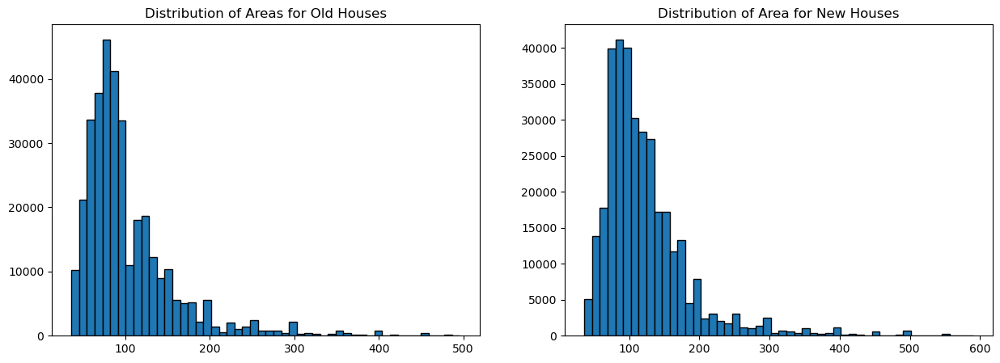

In [34]:
# Distributions
old_props_area = data_2[
    (data_2['construction_year_eng'] < 1396) & 
    ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
    ]['building_size']

new_props_area = data_2[
    (data_2['construction_year_eng'] >= 1396) &
      ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
      ]['building_size']

# Removing NaNs
old_props_area = old_props_area.dropna()
new_props_area = new_props_area.dropna()

# Cut extreme outliers
upper = old_props_area.quantile(0.99)
lower = old_props_area.quantile(0.01)

old_props_area = old_props_area[(old_props_area < upper) & (old_props_area > lower)]

upper = new_props_area.quantile(0.99)
lower = new_props_area.quantile(0.01)

new_props_area = new_props_area[(new_props_area < upper) & (new_props_area > lower)]

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(old_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas for Old Houses')
plt.subplot(1, 2, 2)
plt.hist(new_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Area for New Houses')

-> According to histograms, both distributions are highly **right skewed,** so we use a non-parametric method to thest our hypothesis.

> ⚠️ **Note:** Since the distributions have almost 1M samples, we can't use Shapiro Mehtod to check normality.

Now, Test the Hypothesis:

In [35]:
# Sanity check
old_props_area.median(), new_props_area.median(), len(old_props_area), len(new_props_area)

(88.0, 108.0, 345015, 342124)

In [ ]:
# Test our hypothesis using Mann–Whitney U test (A non-parametric test)
stat, p_value = stats.mannwhitneyu(old_props_area, new_props_area, alternative='greater')

if p_value < 0.05:
    print("✅ H₀ is Rejected -> The distributions are similar, so the main hypothesis might be true")
else:
    print("❌ Failed to Reject H₀ -> The distributions are not similar, so the main hypothesis might be false")

❌ Failed to Reject H₀ -> No Sufficient evidence to Prove That Older Houses Were Bigger


**Second Method: Apply Log Transformation on Distributions And Use T-test**

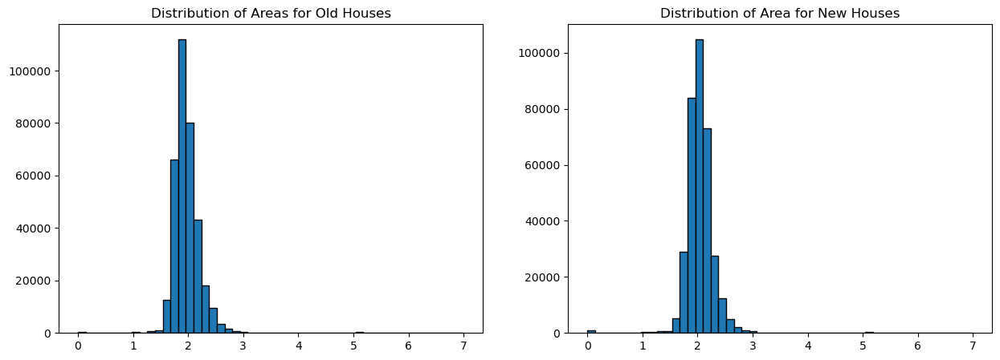

In [37]:
# Distributions
old_props_area = data_2[
    (data_2['construction_year_eng'] < 1396) & 
    ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
    ]['building_size']

new_props_area = data_2[
    (data_2['construction_year_eng'] >= 1396) &
      ((data_2['cat2_slug'] == 'residential-sell') | (data_2['cat2_slug'] == 'residential-rent'))
      ]['building_size']

# Removing NaNs
old_props_area = old_props_area.dropna()
new_props_area = new_props_area.dropna()

# Apply log transformation
old_props_area = np.log10(old_props_area)
new_props_area = np.log10(new_props_area)

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(old_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Areas for Old Houses')
plt.subplot(1, 2, 2)
plt.hist(new_props_area, bins=50, edgecolor='black')
plt.title('Distribution of Area for New Houses')
# Removing NaNs
old_props_area = old_props_area.dropna()
new_props_area = new_props_area.dropna()

-> Since the distributions are normal, we are able to test our hypothesis using **parameteric methods** (e.x. t-test).

In [38]:
# Test our hypothesis using t-test (A parametric test)
from scipy.stats import ttest_ind

t_stat, p_value = ttest_ind(
    old_props_area,
    new_props_area,
    alternative="greater"
)

if p_value < 0.05:
    print("✅ H₀ is Rejected -> Residential Properties in Metropolises Do Have Smaller Average Area Than in Towns")
else:
    print("❌ Failed to Reject H₀ -> No Sufficient evidence to Prove That Houses in Metropolises Are Smaller")

❌ Failed to Reject H₀ -> No Sufficient evidence to Prove That Houses in Metropolises Are Smaller


**Conclusion:** Both parametric and non-parametric methods failed to reject the null-hypothesis, so the alternative hypothesis is **False**.

In [39]:
del old_props_area, new_props_area, upper, lower

---

##### Q3. Having a business deed has a significant impact on the average sales price of commercial property.

> **H₀ (null hypothesis):** Having a business deed dosen't have a significant impact on the average sales price of commercial property.

-> This is a **two-tailed** Hypothesis, since it says it does have effect or not.

**Check Distributions Normality Using Histograms:**

Text(0.5, 1.0, 'Distribution of Prices without Deed')

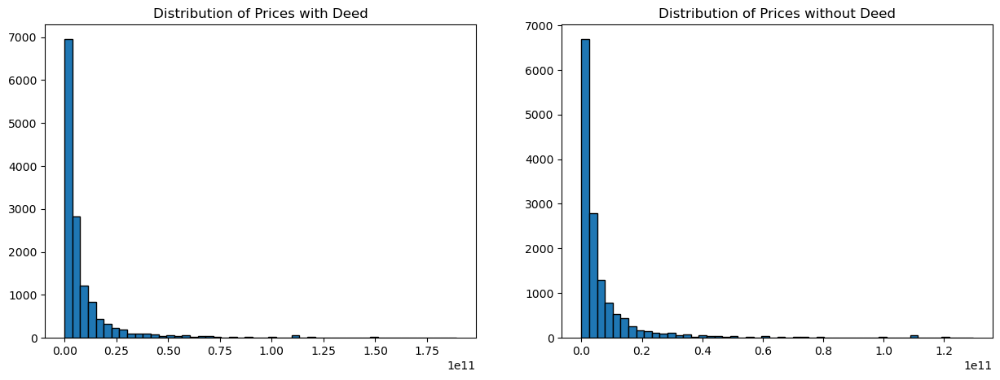

In [40]:
# Distributions
price_with_deed = data_2[
    (data_2['cat2_slug'] == "commercial-sell") &
    (data_2['has_business_deed'] == True)
]['price_value']

price_without_deed = data_2[
    (data_2['cat2_slug'] == "commercial-sell") &
    (data_2['has_business_deed'] == False)
]['price_value']

# Removing NaNs
price_with_deed = price_with_deed.dropna()
price_without_deed = price_without_deed.dropna()

# Cut extreme outliers
upper = price_with_deed.quantile(0.99)
lower = price_with_deed.quantile(0.01)

price_with_deed = price_with_deed[(price_with_deed < upper) & (price_with_deed > lower)]

upper = price_without_deed.quantile(0.99)
lower = price_without_deed.quantile(0.01)

price_without_deed = price_without_deed[(price_without_deed < upper) & (price_without_deed > lower)]

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(price_with_deed, bins=50, edgecolor='black')
plt.title('Distribution of Prices with Deed')
plt.subplot(1, 2, 2)
plt.hist(price_without_deed, bins=50, edgecolor='black')
plt.title('Distribution of Prices without Deed')

-> According to histograms, both distributions are highly **right skewed,** so we use a non-parametric method to test our hypothesis.

> ⚠️ **Note:** Since the distributions have almost 1M samples, we can't use Shapiro Mehtod to check normality.

Now, Test the Hypothesis:

In [41]:
# Sanity check
price_with_deed.median(), price_without_deed.median(), len(price_with_deed), len(price_without_deed)

(3800000000.0, 2800000000.0, 13938, 14067)

In [ ]:
# Test our hypothesis using Mann–Whitney U test (A non-parametric test)
stat, p_value = stats.mannwhitneyu(price_with_deed, price_without_deed, alternative='two-sided')

if p_value < 0.05:
    print("✅ H₀ is Rejected -> The distributions are similar, so the main hypothesis might be true")
else:
    print("❌ Failed to Reject H₀ -> The distributions are not similar, so the main hypothesis might be false")

✅ H₀ is Rejected -> Having a Business Deed Has a Sgnificant Effect on Price


**Conclusion:** We rejected the null-hypothesis by *Mann Withney U test*, so the alternative hypothesis is **True**.

In [43]:
del price_with_deed, price_without_deed, upper, lower

---

##### Q4. The average price increases significantly for luxury features. But does this average also differ significantly for non-luxury features?

-> We Have Two Hypothesises here

**First null-hypothesis:**
> **H₀ (null hypothesis):** Having a luxury features does not affect the average price.

**Second null-hypothesis:**
> **H₀ (null hypothesis):** Having a non-luxury features does not affect the average price.

-> These are **two-tailed** Hypothesises, since it says it does have effect or not.

**First, preprocess the data:**

In [44]:
# Create a columns called has_luxury
luxury_cols = ["has_pool", "has_sauna", "has_barbecue", "has_jacuzzi"]
non_luxury_cols = [
    'has_balcony', 'has_cooling_system', 'has_electricity', 'has_elevator', 'has_gas', 'has_heating_system',
    'has_restroom', 'has_warehouse', 'has_warm_water_provider', 'has_water'
    ]

data_2["has_luxury"] = data_2[luxury_cols].any(axis=1)
data_2["has_non_luxury"] = data_2[non_luxury_cols].any(axis=1)
data_2.has_luxury.value_counts()

has_luxury
False    991354
True       8646
Name: count, dtype: int64

#### **Fist Hypothesis Check:**

**Check Distributions Normality Using Histograms:**

Text(0.5, 1.0, 'Distribution of Prices without Luxury Features')

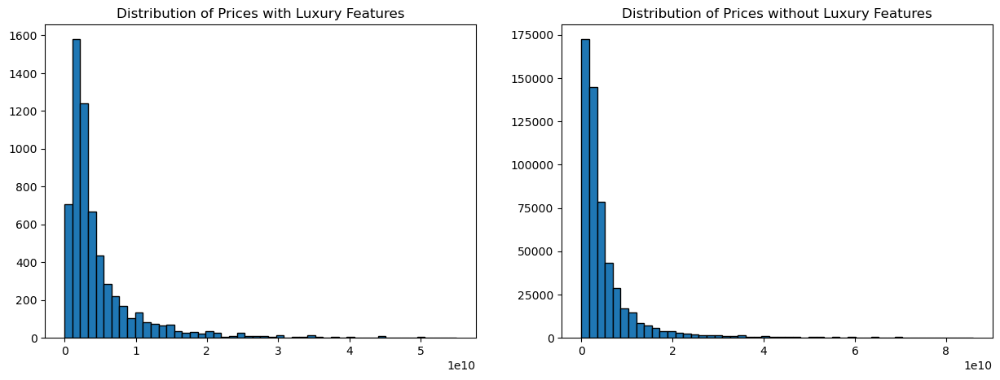

In [45]:
# Distribution
luxury_price = data_2[data_2["has_luxury"] == True]["price_value"]
non_luxury_price = data_2[data_2["has_luxury"] == False]["price_value"]

# Removing NaNs
luxury_price = luxury_price.dropna()
non_luxury_price = non_luxury_price.dropna()

# Cut extreme outliers
upper = luxury_price.quantile(0.99)
lower = luxury_price.quantile(0.01)

luxury_price = luxury_price[(luxury_price < upper) & (luxury_price > lower)]

upper = non_luxury_price.quantile(0.99)
lower = non_luxury_price.quantile(0.01)

non_luxury_price = non_luxury_price[(non_luxury_price < upper) & (non_luxury_price > lower)]

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(luxury_price, bins=50, edgecolor='black')
plt.title('Distribution of Prices with Luxury Features')
plt.subplot(1, 2, 2)
plt.hist(non_luxury_price, bins=50, edgecolor='black')
plt.title('Distribution of Prices without Luxury Features')

-> According to histograms, both distributions are highly **right skewed,** so we use a non-parametric method to test our hypothesis.

> ⚠️ **Note:** Since the distributions have almost 1M samples, we can't use Shapiro Mehtod to check normality.

Now, Test the Hypothesis:

In [46]:
# Sanity check
print(f"{luxury_price.median():.2e}, {non_luxury_price.median():.2e}, {len(luxury_price)}, {len(non_luxury_price)}")

2.95e+09, 2.84e+09, 6165, 550804


In [ ]:
# Test our hypothesis using Mann–Whitney U test (A non-parametric test)
stat, p_value = stats.mannwhitneyu(luxury_price, non_luxury_price, alternative='two-sided')

if p_value < 0.05:
    print("✅ H₀ is Rejected -> Having Luxury Features Probably Affects the Average Price.")
else:
    print("❌ Failed to Reject H₀ -> Having Luxury Features Probably Does Not Affect the Average Price.")

✅ H₀ is Rejected -> Having Luxury Features Affects the Average Price.


**Conclusion:** We rejected the null-hypothesis by *Mann Withney U test*, so the alternative hypothesis is **True**.

#### -> First Hypothesis Is True

#### **Second Hypothesis Check:**

**Check Distributions Normality Using Histograms:**

Text(0.5, 1.0, 'Distribution of Prices without Non-Luxury Features')

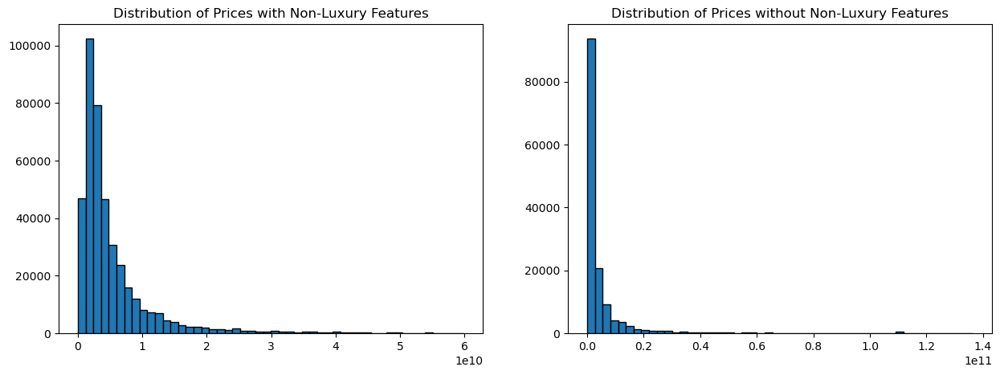

In [48]:
# Distribution
price_with_non_luxury = data_2[data_2["has_non_luxury"] == True]["price_value"]
price_without_non_luxury = data_2[data_2["has_non_luxury"] == False]["price_value"]

# Removing NaNs
price_with_non_luxury = price_with_non_luxury.dropna()
price_without_non_luxury = price_without_non_luxury.dropna()

# Cut extreme outliers
upper = price_with_non_luxury.quantile(0.99)
lower = price_with_non_luxury.quantile(0.01)

price_with_non_luxury = price_with_non_luxury[(price_with_non_luxury < upper) & (price_with_non_luxury > lower)]

upper = price_without_non_luxury.quantile(0.99)
lower = price_without_non_luxury.quantile(0.01)

price_without_non_luxury = price_without_non_luxury[(price_without_non_luxury < upper) & (price_without_non_luxury > lower)]

# Cheack wether the distributions are normal
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.hist(price_with_non_luxury, bins=50, edgecolor='black')
plt.title('Distribution of Prices with Non-Luxury Features')
plt.subplot(1, 2, 2)
plt.hist(price_without_non_luxury, bins=50, edgecolor='black')
plt.title('Distribution of Prices without Non-Luxury Features')

-> According to histograms, both distributions are highly **right skewed,** so we use a non-parametric method to test our hypothesis.

> ⚠️ **Note:** Since the distributions have almost 1M samples, we can't use Shapiro Mehtod to check normality.

Now, Test the Hypothesis:

In [ ]:
# Sanity check
print(f"{price_with_non_luxury.median():.2e}, {price_without_non_luxury.median():.2e}, {len(price_with_non_luxury)}, {len(price_without_non_luxury)}")

3.20e+09, 1.58e+09, 413064, 143522


In [ ]:
# Test our hypothesis using Mann–Whitney U test (A non-parametric test)
stat, p_value = stats.mannwhitneyu(price_with_non_luxury, price_without_non_luxury, alternative='two-sided')

if p_value < 0.05:
    print("✅ H₀ is Rejected -> Having Non-Luxury Features Probably Affects the Average Price.")
else:
    print("❌ Failed to Reject H₀ -> Having Non-Luxury Features Probably Does Not Affect the Average Price.")

✅ H₀ is Rejected -> Having Non-Luxury Features Affects the Average Price.


**Conclusion:** We rejected the null-hypothesis by *Mann Withney U test*, so the alternative hypothesis is **True**.

#### -> **Second Hypothesis Is Also True**

In [ ]:
del luxury_price, non_luxury_price, price_with_non_luxury, price_without_non_luxury, upper, lower